In [1]:
# Import Libraries
import matplotlib.pyplot as plt                        # visualize with plots
%matplotlib inline
import seaborn as sns
import plotly.express as px 
import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.linear_model  import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

import warnings

# Suppress all warnings
warnings.filterwarnings('ignore')

# Your code here

import os

In [2]:
df = pd.read_csv('/Users/kaushikkarmakar/Downloads/leaf_disease_features.csv')

In [3]:
df

,contrast,correlation,energy,homogeneity,dissimilarity,entropy,asm,cluster_shade,cluster_prominence,mean_r,...,eccentricity,circularity,solidity,extent,mean_intensity,median_intensity,variance_intensity,skewness_intensity,kurtosis_intensity,label
0,6.015054,0.990884,0.721945,0.983174,0.264654,1.195522,0.521205,1.122316e-08,1.374320e+10,0.000000,...,0.280776,0.734057,0.964801,0.707134,13.597995,0.0,329.280137,0.592769,-1.642334,Healthy leaf
1,5.983184,0.990688,0.731095,0.983810,0.263893,1.158278,0.534500,4.661160e-11,1.374320e+10,0.000000,...,0.665319,0.802436,0.980228,0.704111,12.828404,0.0,320.555815,0.687001,-1.521721,Healthy leaf
2,5.940383,0.990935,0.722611,0.983216,0.265295,1.204672,0.522167,-7.429207e-09,1.374320e+10,0.210941,...,0.382475,0.673901,0.968119,0.710839,13.439672,0.0,327.019678,0.612603,-1.616608,Gray spot
3,144.863789,0.972148,0.015095,0.175157,7.569747,12.645722,0.000228,1.450189e-09,1.374320e+10,109.689450,...,0.826837,0.053929,0.730813,0.463571,122.264728,113.0,2598.365326,0.542292,-0.467306,Healthy leaf
4,68.595572,0.990818,0.034719,0.343859,3.950152,10.857579,0.001205,9.201813e-10,1.374320e+10,133.541920,...,0.247888,0.157565,0.625259,0.624661,150.972417,181.0,3733.500435,-0.469027,-1.411769,Gray spot
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3277,72.188561,0.992464,0.027417,0.338344,3.909493,11.236872,0.000752,1.079343e-09,1.374320e+10,109.699090,...,0.388738,0.123159,0.515306,0.515306,124.658841,139.0,4795.234575,-0.001114,-1.659117,Rust
3278,23.887252,0.997115,0.362204,0.589897,2.123118,7.411537,0.131192,6.243681e-10,1.374320e+10,56.677338,...,0.784483,0.433391,0.982685,0.982685,77.398896,84.0,4133.529717,-0.172586,-1.691660,Alternaria leaf spot
3279,6.166720,0.991210,0.715341,0.986575,0.243514,1.183439,0.511713,3.752120e-09,1.374320e+10,0.000000,...,0.506032,0.732630,0.971556,0.856349,14.486488,0.0,350.150367,0.642027,-0.910915,Alternaria leaf spot
3280,4.730221,0.992807,0.724484,0.986223,0.215127,1.163596,0.524877,-3.697551e-09,1.374320e+10,0.000000,...,0.604294,0.777836,0.965562,0.698472,13.484036,0.0,328.160061,0.606334,-1.626346,Healthy leaf


# Dataset Rows & Columns count

In [4]:
df.shape


(3282, 34)

# Dataset Information

In [5]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3282 entries, 0 to 3281
Data columns (total 34 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   contrast            3282 non-null   float64
 1   correlation         3282 non-null   float64
 2   energy              3282 non-null   float64
 3   homogeneity         3282 non-null   float64
 4   dissimilarity       3282 non-null   float64
 5   entropy             3282 non-null   float64
 6   asm                 3282 non-null   float64
 7   cluster_shade       3282 non-null   float64
 8   cluster_prominence  3282 non-null   float64
 9   mean_r              3282 non-null   float64
 10  mean_g              3282 non-null   float64
 11  mean_b              3282 non-null   float64
 12  std_r               3282 non-null   float64
 13  std_g               3282 non-null   float64
 14  std_b               3282 non-null   float64
 15  mean_hue            3282 non-null   float64
 16  mean_s

# Duplicate Values

In [6]:
len(df[df.duplicated()])


8

# dropping duplicate values



In [7]:
df = df.drop_duplicates()

# Missing Values/Null Values

In [8]:
def missing_values(df):
    mis_val=df.isnull().sum()
    mis_val_percent=round(df.isnull().mean().mul(100),2)
    mz_table=pd.concat([mis_val,mis_val_percent],axis=1)
    mz_table=mz_table.rename(
    columns={df.index.name:'col_name',0:'Missing Values',1:'% of Total Values'})
    mz_table['Data_type']=df.dtypes
    mz_table=mz_table.sort_values('% of Total Values',ascending=False)
    return mz_table.reset_index()

In [9]:
missing_values(df)

,index,Missing Values,% of Total Values,Data_type
0,contrast,0,0.0,float64
1,circularity,0,0.0,float64
2,std_saturation,0,0.0,float64
3,std_value,0,0.0,float64
4,area,0,0.0,float64
5,perimeter,0,0.0,float64
6,aspect_ratio,0,0.0,float64
7,eccentricity,0,0.0,float64
8,solidity,0,0.0,float64
9,correlation,0,0.0,float64


# Understanding Your Variables

In [10]:
df.describe()


,contrast,correlation,energy,homogeneity,dissimilarity,entropy,asm,cluster_shade,cluster_prominence,mean_r,...,aspect_ratio,eccentricity,circularity,solidity,extent,mean_intensity,median_intensity,variance_intensity,skewness_intensity,kurtosis_intensity
count,3274.000000,3274.000000,3274.000000,3274.000000,3274.000000,3274.000000,3274.000000,3.274000e+03,3.274000e+03,3274.000000,...,3274.000000,3274.000000,3274.000000,3274.000000,3274.000000,3274.000000,3274.000000,3274.000000,3274.000000,3274.000000
mean,69.878566,0.981477,0.411018,0.657506,2.969677,6.081129,0.284954,6.766820e-10,1.374320e+10,60.592420,...,0.708175,0.624449,0.527064,0.820240,0.664779,72.626411,71.773213,1890.460810,0.397763,-0.420243
std,102.469770,0.017390,0.340667,0.340129,3.336868,4.985005,0.276044,4.189928e-09,3.109723e-05,64.268850,...,0.217371,0.224356,1.469737,0.176991,0.146970,63.329394,75.759005,2132.212373,0.829896,1.983241
min,1.551770,0.853670,0.010207,0.089357,0.079116,0.352409,0.000104,-2.230422e-08,1.374320e+10,0.000000,...,0.000000,0.000000,0.000000,0.301796,0.081250,1.722317,0.000000,61.649196,-2.518126,-1.994387
25%,6.410524,0.979480,0.035937,0.341686,0.277697,1.209916,0.001291,3.393552e-11,1.374320e+10,0.000000,...,0.591334,0.457911,0.164322,0.666302,0.591015,12.904048,0.000000,329.586503,-0.125774,-1.442030
50%,16.866932,0.989287,0.607107,0.942805,0.649984,2.180043,0.368579,1.094691e-09,1.374320e+10,20.229875,...,0.751368,0.655990,0.496248,0.922483,0.687752,27.487424,38.000000,568.116996,0.371211,-0.848320
75%,93.821894,0.991282,0.728289,0.982697,4.931699,10.896059,0.530405,1.680462e-09,1.374320e+10,119.489296,...,0.883117,0.799755,0.685813,0.959347,0.739769,132.058120,135.000000,2994.814143,0.879722,-0.129151
max,630.532231,0.999308,0.952316,0.994469,15.684217,13.642444,0.906906,2.239153e-08,1.374320e+10,217.197220,...,1.000000,1.000000,37.699112,1.000000,1.000000,220.713807,254.000000,11589.524824,4.630439,28.243539


# Data Vizualization

In [11]:
df['label'].value_counts()

label
Healthy leaf            818
Gray spot               783
Rust                    688
Alternaria leaf spot    556
Brown spot              429
Name: count, dtype: int64

In [12]:
import pandas as pd
import plotly.express as px



# Count the occurrences of each label
label_counts = df['label'].value_counts().reset_index()
label_counts.columns = ['label', 'count']

# Create a pie chart using Plotly
fig = px.pie(
    label_counts,
    names='label',
    values='count',
    title="Distribution of Labels in the Dataset",
    color_discrete_sequence=px.colors.qualitative.Set3
)

# Show the plot
fig.show()


In [13]:
import pandas as pd

# Load the dataset
#df = pd.read_csv('/Users/kaushikkarmakar/Downloads/leaf_disease_features.csv')

# Sort the dataset by the 'label' column
df = df.sort_values(by='label')



In [14]:
#df = pd.DataFrame(data)

# List of columns to visualize
columns_to_plot = [
    'contrast', 'correlation', 'energy', 'homogeneity', 'dissimilarity',
    'entropy', 'asm', 'cluster_shade', 'cluster_prominence', 'mean_r',
    'mean_g', 'mean_b', 'std_r', 'std_g', 'std_b', 'mean_hue',
    'mean_saturation', 'mean_value', 'std_hue', 'std_saturation',
    'std_value', 'area', 'perimeter', 'aspect_ratio', 'eccentricity',
    'circularity', 'solidity', 'extent', 'mean_intensity',
    'median_intensity', 'variance_intensity', 'skewness_intensity',
    'kurtosis_intensity'
]

# Create a box plot for each column
for column in columns_to_plot:
    fig = px.box(df, y=column, title=f"Box Plot for {column}")
    fig.show()


In [15]:
df['label']=df['label'].map(
{'Alternaria leaf spot': 0,
 'Brown spot': 1,
 'Gray spot': 2,
 'Healthy leaf': 3,
 'Rust': 4})

In [16]:
df['label'].value_counts()

label
3    818
2    783
4    688
0    556
1    429
Name: count, dtype: int64

In [17]:
import pandas as pd

# List of column names
columns = ['contrast', 'correlation', 'energy', 'homogeneity', 'dissimilarity',
       'entropy', 'asm', 'cluster_shade', 'cluster_prominence', 'mean_r',
       'mean_g', 'mean_b', 'std_r', 'std_g', 'std_b', 'mean_hue',
       'mean_saturation', 'mean_value', 'std_hue', 'std_saturation',
       'std_value', 'area', 'perimeter', 'aspect_ratio', 'eccentricity',
       'circularity', 'solidity', 'extent', 'mean_intensity',
       'median_intensity', 'variance_intensity', 'skewness_intensity',
       'kurtosis_intensity',
]

# Capping function using percentiles
def cap_outliers(df, column):
    upper_lim = df[column].quantile(0.85)
    lower_lim = df[column].quantile(0.10)
    df.loc[df[column] > upper_lim, column] = upper_lim
    df.loc[df[column] < lower_lim, column] = lower_lim

# Loop through each column and cap outliers
for column in columns:
    cap_outliers(df, column)

In [18]:
#df = pd.DataFrame(data)

# List of columns to visualize
columns_to_plot = [
    'contrast', 'correlation', 'energy', 'homogeneity', 'dissimilarity',
    'entropy', 'asm', 'cluster_shade', 'cluster_prominence', 'mean_r',
    'mean_g', 'mean_b', 'std_r', 'std_g', 'std_b', 'mean_hue',
    'mean_saturation', 'mean_value', 'std_hue', 'std_saturation',
    'std_value', 'area', 'perimeter', 'aspect_ratio', 'eccentricity',
    'circularity', 'solidity', 'extent', 'mean_intensity',
    'median_intensity', 'variance_intensity', 'skewness_intensity',
    'kurtosis_intensity'
]

# Create a box plot for each column
for column in columns_to_plot:
    fig = px.box(df, y=column, title=f"Box Plot for {column}")
    fig.show()


# train test split 

In [19]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.datasets import make_classification


# Separate features (X) and labels (y)
# Assuming the label column is named 'label'
X = df.drop(columns=['label'])  # Drop the label column to keep only features
y = df['label']  # Extract the label column




In [20]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif

# Define the number of top features to select (you can adjust k as needed)
k = 10  

# Apply SelectKBest with mutual_info_classif
selector = SelectKBest(score_func=mutual_info_classif, k=k)
X_selected = selector.fit_transform(X, y)

# Get selected feature names
selected_features = X.columns[selector.get_support()]

# Convert the selected features into a DataFrame
X_selected_df = pd.DataFrame(X_selected, columns=selected_features)

# Print selected features
print("Selected Features:", selected_features)


Selected Features: Index(['energy', 'homogeneity', 'entropy', 'asm', 'mean_r', 'mean_g', 'std_r',
       'std_g', 'mean_hue', 'std_hue'],
      dtype='object')


# data balancing 

In [21]:
X_selected_df

,energy,homogeneity,entropy,asm,mean_r,mean_g,std_r,std_g,mean_hue,std_hue
0,0.363681,0.594805,7.740631,0.132264,52.123226,88.987370,43.971010,67.830615,65.988830,59.106700
1,0.019229,0.189651,11.964207,0.000370,84.803410,118.819560,44.609490,53.739475,85.976050,33.307423
2,0.705391,0.984933,1.229204,0.497576,0.000000,0.511584,0.000000,7.767924,0.239805,3.641214
3,0.704250,0.984933,1.180824,0.495968,0.000000,0.092839,0.000000,3.247053,0.043518,1.522056
4,0.364899,0.564765,7.777641,0.133151,57.209440,89.985280,47.441387,67.830615,63.635925,65.121970
...,...,...,...,...,...,...,...,...,...,...
3269,0.713080,0.973661,1.451540,0.508484,0.000000,4.351585,0.000000,22.809792,4.093380,21.492350
3270,0.700861,0.983553,1.290271,0.491206,0.000000,0.681226,0.000000,9.053902,0.636030,8.495624
3271,0.706972,0.977368,1.390825,0.499810,0.000000,2.218282,0.000000,16.396640,2.082373,15.435344
3272,0.659801,0.966370,1.695873,0.435338,0.000000,5.809857,0.000000,26.092245,5.463606,24.609629


In [22]:
from imblearn.over_sampling import SMOTE

# Apply SMOTE to balance the labels (y)
smote = SMOTE(random_state=42)
X_selected_balanced, y_selected_balanced = smote.fit_resample(X_selected_df, y)

# Check the class distribution after SMOTE
print("Class distribution in the resampled dataset after SMOTE:")
print(pd.Series(y_selected_balanced).value_counts())

# Optionally, you can now split the resampled data into train-test sets again if needed


Class distribution in the resampled dataset after SMOTE:
label
0    818
1    818
2    818
3    818
4    818
Name: count, dtype: int64


In [23]:
import warnings
warnings.filterwarnings('ignore')

In [24]:
df

,contrast,correlation,energy,homogeneity,dissimilarity,entropy,asm,cluster_shade,cluster_prominence,mean_r,...,eccentricity,circularity,solidity,extent,mean_intensity,median_intensity,variance_intensity,skewness_intensity,kurtosis_intensity,label
2793,18.952895,0.992359,0.363681,0.594805,1.928431,7.740631,0.132264,9.174528e-10,1.374320e+10,52.123226,...,0.794554,0.338856,0.962208,0.772841,78.182976,86.0,4396.076114,-0.065310,-1.608410,0
3080,108.482023,0.980957,0.019229,0.189651,6.785754,11.964207,0.000370,1.811031e-09,1.374320e+10,84.803410,...,0.670985,0.678763,0.842900,0.620000,111.681940,93.0,2855.000819,0.855498,-0.401465,0
987,7.527907,0.990133,0.705391,0.984933,0.269058,1.229204,0.497576,3.748721e-09,1.374320e+10,0.000000,...,0.503283,0.737168,0.967650,0.772841,15.744798,0.0,380.882955,0.737312,0.121280,0
989,5.987388,0.991643,0.704250,0.984933,0.233504,1.180824,0.495968,3.748721e-09,1.374320e+10,0.000000,...,0.553274,0.737168,0.967650,0.772841,16.307498,0.0,357.806892,0.359800,-1.540978,0
990,22.287476,0.992359,0.364899,0.564765,2.288397,7.777641,0.133151,8.433290e-10,1.374320e+10,57.209440,...,0.789582,0.427151,0.956773,0.772841,80.807318,84.0,4651.625030,-0.095161,-1.688987,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1808,12.147502,0.985831,0.713080,0.973661,0.477659,1.451540,0.508484,3.748721e-09,1.374320e+10,0.000000,...,0.838145,0.701059,0.951053,0.696839,14.157805,0.0,427.663754,1.094110,0.126545,4
1795,5.082467,0.992359,0.700861,0.983553,0.239670,1.290271,0.491206,3.001333e-11,1.374320e+10,0.000000,...,0.824396,0.698647,0.955865,0.744364,15.953284,0.0,363.284768,0.437758,-1.531478,4
1794,8.715247,0.988751,0.706972,0.977368,0.376281,1.390825,0.499810,6.798473e-11,1.374320e+10,0.000000,...,0.516958,0.604860,0.927147,0.682175,14.660874,0.0,386.615502,0.807316,-0.645933,4
1831,12.362908,0.987157,0.659801,0.966370,0.543081,1.695873,0.435338,5.411493e-11,1.374320e+10,0.000000,...,0.686929,0.713590,0.961137,0.712075,19.465282,0.0,480.863630,0.592633,-0.690308,4


In [25]:
def Visualize_confusion_matrix(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Oranges',
                xticklabels=['DE','SI','SE','HO','CA','BA' ,'BO'], yticklabels=['DE','SI','SE','HO','CA','BA' ,'BO'])
    plt.title('Accuracy: {0:.4f}'.format(accuracy_score(y_test, y_pred)))
    plt.ylabel('True Values')
    plt.xlabel('Predicted Values')
    plt.show()
    
    print("\n")
    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    return

In [26]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score

# data scaling 

In [27]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Fit and transform the training data (X_selected_balanced)
X_selected_balanced_scaled = scaler.fit_transform(X_selected_balanced)

# Transform the test data (X_selected_df) using the same scaler
X_selected_test_scaled = scaler.transform(X_selected_df)

# Convert the scaled data back into DataFrame for easy visualization or further processing
X_selected_balanced_scaled_df = pd.DataFrame(X_selected_balanced_scaled, columns=X_selected_balanced.columns)
X_selected_test_scaled_df = pd.DataFrame(X_selected_test_scaled, columns=X_selected_df.columns)

# Print the first few rows of the scaled data to check
print("Scaled Training Data (First 5 rows):")
print(X_selected_balanced_scaled_df.head())

print("\nScaled Test Data (First 5 rows):")
print(X_selected_test_scaled_df.head())


Scaled Training Data (First 5 rows):
     energy  homogeneity   entropy       asm    mean_r    mean_g     std_r  \
0 -0.139309    -0.229310  0.381356 -0.554570 -0.078280  0.340941  0.374643   
1 -1.188954    -1.467493  1.263944 -1.065773  0.476137  0.783999  0.395350   
2  0.901976     0.962953 -0.979316  0.861324 -0.962546 -0.973076 -1.051418   
3  0.898501     0.962953 -0.989426  0.855094 -0.962546 -0.979295 -1.051418   
4 -0.135599    -0.321114  0.389090 -0.551131  0.008007  0.355761  0.487194   

      std_g  mean_hue   std_hue  
0  1.449492  0.219211  0.917438  
1  0.917693  0.571756 -0.057106  
2 -0.817274 -0.940508 -1.177720  
3 -0.987892 -0.943970 -1.257770  
4  1.449492  0.177709  1.144659  

Scaled Test Data (First 5 rows):
     energy  homogeneity   entropy       asm    mean_r    mean_g     std_r  \
0 -0.139309    -0.229310  0.381356 -0.554570 -0.078280  0.340941  0.374643   
1 -1.188954    -1.467493  1.263944 -1.065773  0.476137  0.783999  0.395350   
2  0.901976     0.9629

# LogisticRegression

# hyper parameter tuning

In [29]:
# Import necessary libraries
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Initialize the Logistic Regression model with the given parameters
log_reg_model = LogisticRegression(
    C=0.1,
    class_weight=None,
    dual=False,
    fit_intercept=True,
    intercept_scaling=1,
    penalty=None,
    random_state=42,
    solver='newton-cg',
    tol=0.0001
)

# Fit the model on the scaled and balanced training data
log_reg_model.fit(X_selected_balanced_scaled_df, y_selected_balanced)

# Predict on the scaled test data
y_pred = log_reg_model.predict(X_selected_test_scaled_df)

# Evaluate the model
accuracy = accuracy_score(y, y_pred)  # Assuming y is the true labels for the test set
print(f"Model Accuracy: {accuracy:.4f}")

# Print classification report
print(classification_report(y, y_pred))


Model Accuracy: 0.7993
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       556
           1       0.65      0.73      0.68       429
           2       0.73      0.57      0.64       783
           3       0.83      0.92      0.87       818
           4       0.85      0.86      0.86       688

    accuracy                           0.80      3274
   macro avg       0.79      0.80      0.79      3274
weighted avg       0.80      0.80      0.79      3274



In [30]:
acc1 = accuracy_score(y, y_pred)


In [31]:
acc1

0.7993280390959071

# knn

In [32]:
import numpy as np
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold

# Define the KNN classifier with parameters
knn = KNeighborsClassifier(
    n_neighbors=5,  # Number of neighbors to consider
    weights='uniform',  # Uniform weights for neighbors
    algorithm='auto',   # Automatically selects the best algorithm
    p=2                 # L2 (Euclidean) distance
)

# Set up cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform cross-validation
cv_scores = cross_val_score(knn, X_selected_balanced_scaled_df, y_selected_balanced, cv=cv, scoring='accuracy')

# Output cross-validation results
print(f"Cross-validation scores: {cv_scores}")
print(f"Mean accuracy: {np.mean(cv_scores):.4f}")
print(f"Standard deviation: {np.std(cv_scores):.4f}")


Cross-validation scores: [0.87652812 0.88508557 0.88997555 0.8997555  0.89731051]
Mean accuracy: 0.8897
Standard deviation: 0.0084


# hyper parameter tuning

In [37]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

# Define the parameter grid
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [10, 20, 30, 40, 50],
    'p': [1, 2],  # Manhattan (p=1) and Euclidean (p=2)
}

# Initialize the KNN classifier
knn = KNeighborsClassifier()

# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=knn,
    param_grid=param_grid,
    scoring='accuracy',  # You can use 'f1_weighted' for imbalanced datasets
    cv=5,                # 5-fold cross-validation
    n_jobs=-1,           # Use all available processors
    verbose=2            # Display progress during search
)

# Perform the grid search on the scaled training data
grid_search.fit(X_selected_balanced_scaled_df, y_selected_balanced)

# Output the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)


Fitting 5 folds for each of 400 candidates, totalling 2000 fits

[CV] END algorithm=ball_tree, leaf_size=40, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, n_neighbors=11, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tr

In [43]:
# Import necessary libraries
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report

# Initialize the KNN model with the given parameters
knn_model = KNeighborsClassifier(
    algorithm='auto',
    leaf_size=10,
    n_neighbors=3,
    p=1,  # Manhattan distance
    weights='distance'
)

# Fit the model on the scaled and balanced training data
knn_model.fit(X_selected_balanced_scaled_df, y_selected_balanced)

# Predict on the scaled test data
y_pred = knn_model.predict(X_selected_test_scaled_df)

# Evaluate the model
accuracy = accuracy_score(y, y_pred)  # Assuming y is the true labels for the test set
print(f"Model Accuracy: {accuracy:.4f}")

# Print classification report
print(classification_report(y, y_pred))


Model Accuracy: 0.9768
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       556
           1       0.85      1.00      0.92       429
           2       1.00      1.00      1.00       783
           3       1.00      0.91      0.95       818
           4       1.00      1.00      1.00       688

    accuracy                           0.98      3274
   macro avg       0.97      0.98      0.97      3274
weighted avg       0.98      0.98      0.98      3274



Model Accuracy: 0.7993
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       556
           1       0.65      0.73      0.68       429
           2       0.73      0.57      0.64       783
           3       0.83      0.92      0.87       818
           4       0.85      0.86      0.86       688

    accuracy                           0.80      3274
   macro avg       0.79      0.80      0.79      3274
weighted avg       0.80      0.80      0.79      3274



In [47]:
acc2 = accuracy_score(y, y_pred)


In [48]:
acc2

0.9767868051313379

# guassian bayes

In [49]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, accuracy_score

# Define the parameter grid for GaussianNB
param_grid = {
    'priors': [None, [0.25, 0.25, 0.25, 0.25], [0.3, 0.3, 0.2, 0.2]],  # Adjust based on the number of classes
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5]
}




In [50]:
# Create the GaussianNB model
gnb = GaussianNB()

# Define scoring metric
scoring = make_scorer(accuracy_score)

# Perform grid search with cross-validation
grid_search = GridSearchCV(
    estimator=gnb,
    param_grid=param_grid,
    scoring=scoring,
    cv=5,  # 5-fold cross-validation
    verbose=1,
    n_jobs=-1  # Use all processors for parallel processing
)

# Fit the grid search on X_train_scaled
grid_search.fit(X_selected_balanced_scaled_df, y_selected_balanced)

# Output the best parameters and corresponding score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Accuracy:", grid_search.best_score_)

# Retrieve and return the best model
best_model = grid_search.best_estimator_
print("Best Model:", best_model)

Fitting 5 folds for each of 15 candidates, totalling 75 fits
Best Parameters: {'priors': None, 'var_smoothing': 1e-09}
Best Cross-Validation Accuracy: 0.2907090464547677
Best Model: GaussianNB()


In [53]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report

# Initialize the GaussianNB model with the specified parameters
gnb_model = GaussianNB(priors=None, var_smoothing=1e-09)

# Fit the model on the scaled and balanced training data
gnb_model.fit(X_selected_balanced_scaled_df, y_selected_balanced)

# Predict on the scaled test data
y_pred = gnb_model.predict(X_selected_test_scaled_df)

# Evaluate the model
accuracy = accuracy_score(y, y_pred)  # Assuming y is the true labels for the test set
print(f"Model Accuracy: {accuracy:.4f}")

# Print classification report
print(classification_report(y, y_pred))


Model Accuracy: 0.2896
              precision    recall  f1-score   support

           0       0.19      0.58      0.29       556
           1       0.83      0.12      0.22       429
           2       1.00      0.01      0.02       783
           3       0.65      0.27      0.38       818
           4       0.29      0.50      0.36       688

    accuracy                           0.29      3274
   macro avg       0.59      0.30      0.25      3274
weighted avg       0.60      0.29      0.25      3274



In [54]:
acc3 = accuracy_score(y, y_pred)


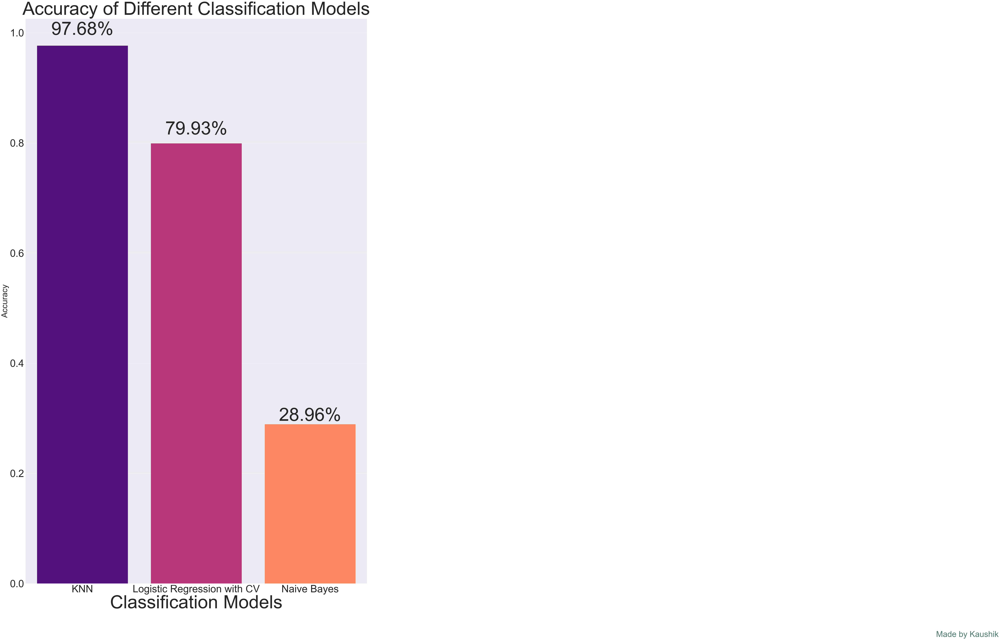

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns

mylist = []
mylist2 = []


mylist.append(acc2)
mylist2.append("KNN")




mylist.append(acc1)
mylist2.append("Logistic Regression with CV")



mylist.append(acc3)
mylist2.append("Naive Bayes")


# Double the original figure size
plt.figure(figsize=(30, 50))  

sns.set_style("darkgrid")
ax = sns.barplot(x=mylist2, y=mylist, palette="magma", saturation=1.5)

plt.xlabel("Classification Models", fontsize=90)
plt.ylabel("Accuracy", fontsize=40)
plt.title("Accuracy of Different Classification Models", fontsize=90)
plt.xticks(fontsize=50, horizontalalignment='center', rotation=0)
plt.yticks(fontsize=50)

# Annotate each bar with accuracy percentage
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy()
    ax.annotate(f'{height:.2%}', (x + width/2, y + height*1.02), ha='center', fontsize=90)

# Add watermark text
plt.text(7.5, -0.1, 'Made by Kaushik', fontsize=40,
         color='#034235', ha='left', va='bottom', alpha=0.7)

plt.show()
